In [45]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import neuromaps
from neuromaps import datasets, transforms, images, resampling, nulls, stats
from scipy.stats import pearsonr, spearmanr, zscore, rankdata
from statsmodels.stats.multitest import multipletests
import math

from itertools import combinations
from neuromaps.datasets import fetch_atlas
from neuromaps.images import load_data
from neuromaps.datasets import fetch_annotation
from neuromaps import plotting
from neuromaps import datasets, images, nulls, resampling
from neuromaps.stats import compare_images
from statsmodels.stats.multitest import multipletests

In [2]:
print("neuromaps version:", neuromaps.__version__)

neuromaps version: 0.0.5+41.gf0ed67c


In [3]:
!wb_command -version

Connectome Workbench
Type: Command Line Application
Version: 2.0.1
Qt Compiled Version: 6.2.3
Qt Runtime Version: 6.2.3
Commit: 150de12f4f4b94b39bec6d9133ad2e7019d2d3ef
Commit Date: 2024-10-15 17:38:41 -0500
Compiler: c++ (/Applications/Xcode.app/Contents/Developer/Toolchains/XcodeDefault.xctoolchain/usr/bin)
Compiler Version: 13.0.0.13000029
Compiled Debug: NO
Operating System: Apple OSX
Compiled with OpenMP: YES


In [48]:
## Preprocessing brain data

brain_maps = [
    {'source': 'savli2012', 'desc': 'way100635', 'space': 'MNI152', 'res': '3mm'},
    {'source': 'margulies2016', 'desc': 'fcgradient01', 'space': 'fsLR', 'den': '32k'},
    {'source': 'raichle', 'desc': 'cmrglc', 'space': 'fsLR', 'den': '164k'},
    {'source': 'mueller2013', 'desc': 'intersubjvar', 'space': 'fsLR', 'den': '164k'},
    {'source': 'abagen', 'desc': 'genepc1', 'space': 'fsaverage', 'den': '10k'},
    {'source': 'hcps1200', 'desc': 'myelinmap', 'space': 'fsLR', 'den': '32k'},
    {'source': 'hcps1200', 'desc': 'thickness', 'space': 'fsLR', 'den': '32k'},
    {'source': 'reardon2018', 'desc': 'scalingnih', 'space': 'civet', 'den': '41k'}
]

single_sphere_counter = 0
for map in brain_maps:
    brain_map = datasets.fetch_annotation(**map)
    if len(brain_map) != 2:
        single_sphere_counter += 1
        print(map)
print(single_sphere_counter)

readable_map_names = {
    'genepc1': 'PC1 Gene Expression',
    'myelinmap': 'T1w/T2w Ratio',
    'thickness': 'Cortical Thickness',
    'fcgradient01': 'Functional Gradient',
    'intersubjvar': 'Intersubject Variability',
    'cmrglc': 'Glucose Metabolism',
    'scalingnih': 'Allometric Scaling (NIH)',
    'way100635':' 5-HT1A Receptor'
}


[References] Please cite the following papers if you are using this data:

  For {'source': 'savli2012', 'desc': 'way100635', 'space': 'MNI152', 'res': '3mm'}:
  [primary]:
    Markus Savli, Andreas Bauer, Markus Mitterhauser, Yu-Shin Ding, Andreas Hahn, Tina Kroll, Alexander Neumeister, Daniela Haeusler, Johanna Ungersboeck, Shannan Henry, and others. Normative database of the serotonergic system in healthy subjects using multi-tracer pet. Neuroimage, 63(1):447–459, 2012.
  [secondary]:
    
{'source': 'savli2012', 'desc': 'way100635', 'space': 'MNI152', 'res': '3mm'}

[References] Please cite the following papers if you are using this data:

  For {'source': 'margulies2016', 'desc': 'fcgradient01', 'space': 'fsLR', 'den': '32k'}:
  [primary]:
    Daniel S Margulies, Satrajit S Ghosh, Alexandros Goulas, Marcel Falkiewicz, Julia M Huntenburg, Georg Langs, Gleb Bezgin, Simon B Eickhoff, F Xavier Castellanos, Michael Petrides, and others. Situating the default-mode network along a princ

In [5]:
def is_volumetric(map_dict):
    """Check if a map is volumetric (MNI space)"""
    return map_dict.get('space') in ['MNI152', 'MNI305']

## Load and transform the dara
def load_and_prepare_map(map_dict, readable_map_names=None, target_space='fsLR', target_den='32k'):
    """
    Load a brain map and prepare it for analysis
    - Volumetric maps: transform to surface
    - Surface maps: resample if needed, use both hemispheres
    - return (transformed data array, space, density)
    """
    # Determine display name for logging
    desc = map_dict['desc']
    if readable_map_names and desc in readable_map_names:
        display_name = readable_map_names[desc]
    else:
        display_name = desc
    
    # Fetch the map
    brain_map = datasets.fetch_annotation(**map_dict)
    
    # Check if volumetric
    if is_volumetric(map_dict):
        print(f"Volumetric map detected, transforming to {target_space} surface...")
        
        # Transform volumetric to surface (both hemispheres)
        try:
            surface_map = transforms.mni152_to_fslr(brain_map, fslr_density=target_den)
            # surface_map will be a tuple of (left_hemi, right_hemi)
            lh_data = images.load_data(surface_map[0])
            rh_data = images.load_data(surface_map[1])
            full_data = np.hstack([lh_data, rh_data])
            return full_data, target_space, target_den
            
        except Exception as e:
            print(f"    Warning: Could not transform volumetric map: {e}")
 
    # Surface map processing
    else:
        src_space = map_dict.get('space')
        src_den = map_dict.get('den')
        template = {'source': 'hcps1200', 'desc': 'thickness', 'space': 'fsLR', 'den': '32k'}
        template_map = datasets.fetch_annotation(**template)
        # Load both hemispheres
        if len(brain_map) == 2:
            lh_map, rh_map = brain_map
        else:
            raise ValueError(f"Expected 2 hemispheres for surface map, got {len(brain_map)}")
        
        if src_den != target_den or src_space != target_space:
            print(f"Resampling from {src_space}-{src_den} to {target_space}-{target_den}...")            
            # Resample both hemispheres
            lh_resampled, _ = resampling.resample_images(
                lh_map, template_map[0],
                src_space=src_space, trg_space=target_space,
                hemi='L', resampling='transform_to_trg'
            )
            rh_resampled, _ = resampling.resample_images(
                rh_map, template_map[1],
                src_space=src_space, trg_space=target_space,
                hemi='R', resampling='transform_to_trg'
            )
            
            lh_data = images.load_data(lh_resampled)
            rh_data = images.load_data(rh_resampled)
        else:
            lh_data = images.load_data(lh_map)
            rh_data = images.load_data(rh_map)
        
        full_data = np.hstack([lh_data, rh_data])
        return full_data, src_space if src_den == target_den else target_space, \
               src_den if src_den == target_den else target_den

In [6]:
## Compute heat map correlation matrix

def compute_preliminary_matrix(prepared_maps, map_names, nulls_list, n_perm=1000, readable_map_names=None):
    """
    - prepared_maps: List of numpy arrays (N_vertices,) for each map.
    - map_names: List of strings naming each map.
    - nulls_list: List of null arrays (N_vertices, n_perm) for each map.
    - n_perm: Number of permutations used (default 1000).
    - readable_map_names: Dictionary mapping map keys (desc) to readable strings.
    """
    
    data_stack = np.column_stack(prepared_maps)
    
    # Global Mask: Remove vertices where ANY map is missing data
    global_mask = np.all((~np.isnan(data_stack)) & (data_stack != 0), axis=1)
    
    clean_data = data_stack[global_mask]
    n_vertices_clean = clean_data.shape[0]
    
    # Z-Score to standardize units (Correlation == Covariance)
    clean_data_z = zscore(clean_data, axis=0)
    
    real_corr = (clean_data_z.T @ clean_data_z) / n_vertices_clean

    p_counts = np.zeros((len(prepared_maps), len(prepared_maps)))
    
    clean_nulls_list = [n[global_mask, :] for n in nulls_list]
    
    for k in range(n_perm):
        if k % 100 == 0: print(f"Permutation {k}/{n_perm}...")
        
        null_data_k = np.zeros_like(clean_data_z)
        for m in range(len(prepared_maps)):
            spin_k = clean_nulls_list[m][:, k]
            null_data_k[:, m] = zscore(spin_k, nan_policy='omit')
            
        null_corr_k = np.corrcoef(null_data_k.T)
        
        # Check: Is random correlation stronger than real correlation?
        is_stronger = np.abs(null_corr_k) >= np.abs(real_corr)
        p_counts += is_stronger.astype(int)

    p_values = (p_counts + 1) / (n_perm + 1)
    
    # Resolve readable names for the DataFrame columns/indices
    display_names = map_names
    if readable_map_names is not None:
        display_names = []
        for name in map_names:
            if name in readable_map_names:
                display_names.append(readable_map_names[name])
                continue
            found_match = False
            for key, val in readable_map_names.items():
                if name.endswith(f"_{key}"):
                    display_names.append(val)
                    found_match = True
                    break
            
            if not found_match:
                display_names.append(name)
    
    df_corr = pd.DataFrame(real_corr, index=display_names, columns=display_names).round(3)
    df_pvals = pd.DataFrame(p_values, index=display_names, columns=display_names).round(3)
    
    # Mask non-significant values (p > 0.05)
    df_significant = df_corr.copy()
    df_significant[df_pvals > 0.05] = 0
    
    return df_corr, df_pvals, df_significant


## Function to plot heatmaps
def plot_correlation_heatmaps(df_corr, df_significant, method=None):
    """
    Plots two side-by-side heatmaps: 
    1. The Full Correlation Matrix
    2. The Significant-Only Matrix (Non-significant cells masked)
    """
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    sns.heatmap(
        df_corr, 
        annot=True, 
        fmt=".2f", 
        cmap='RdBu', 
        center=0, 
        vmin=-1, vmax=1,
        square=True,
        ax=axes[0],
        cbar_kws={'label': method}
    )
    axes[0].set_title("Full Correlation Matrix", fontsize=16)
    axes[0].tick_params(axis='x', rotation=45)
    axes[0].tick_params(axis='y', rotation=0)
    
    # plot matrix masked
    mask = (df_significant == 0)
    
    sns.heatmap(
        df_significant, 
        annot=True, 
        fmt=".2f", 
        cmap='RdBu_r', 
        center=0, 
        vmin=-1, vmax=1,
        square=True,
        mask=mask, # hide non significant cells
        ax=axes[1],
        cbar_kws={'label': method}
    )
    axes[1].set_title("Significant Correlations Only (p < 0.05)", fontsize=16)
    axes[1].tick_params(axis='x', rotation=45)
    axes[1].tick_params(axis='y', rotation=0)
    
    plt.tight_layout()
    plt.show()

In [7]:
## Funciton to plot EDA pairwise scatter plots 

def plot_pairwise_scatterplots(prepared_maps, map_names, readable_map_names=None):
    # data prep
    # 32k rows 8 columns
    data_stack = np.column_stack(prepared_maps)
    global_mask = np.all((~np.isnan(data_stack)) & (data_stack != 0), axis=1) # get rid of NaNs
    clean_data = data_stack[global_mask]
    
    n_maps = len(prepared_maps)
    
    # making sure brain maps names exist and are readable
    # uses readable names instead of desc name
    display_names = map_names
    if readable_map_names:
        display_names = []
        for name in map_names:
            if name in readable_map_names:
                display_names.append(readable_map_names[name])
                continue
            found_match = False
            for key, val in readable_map_names.items():
                if name.endswith(f"_{key}"):
                    display_names.append(val)
                    found_match = True
                    break
            if not found_match:
                display_names.append(name)

    # 28 unique pairs
    n_pairs = (n_maps * (n_maps - 1)) // 2
    n_cols = 4
    n_rows = math.ceil(n_pairs / n_cols)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
    axes = axes.flatten()
    
    plot_idx = 0
    
    for i in range(n_maps):
        for j in range(i + 1, n_maps):
            ax = axes[plot_idx]
            
            x = clean_data[:, i] # column i for all j rows
            y = clean_data[:, j]
            r, _ = pearsonr(x, y)
            rho, _ = spearmanr(x, y)
            # use hexbin for density instead of scatter plot because of ~32k points
            hb = ax.hexbin(x, y, gridsize=50, cmap='Blues', mincnt=1, bins='log')
            # add trend line
            z = np.polyfit(x, y, 1)
            p = np.poly1d(z)
            x_range = np.linspace(x.min(), x.max(), 100)
            ax.plot(x_range, p(x_range), "r--", alpha=0.8, linewidth=2)
            
            ax.set_xlabel(display_names[i], fontsize=8)
            ax.set_ylabel(display_names[j], fontsize=8)
            
            # Green if metrics agree (diff < 0.1), Red if they diverge
            diff = abs(r - rho)
            title_color = 'green' if diff < 0.1 else 'red'
            
            ax.set_title(f"r={r:.2f} | ρ={rho:.2f}", fontsize=10, color=title_color, fontweight='bold')
            ax.set_xticks([])
            ax.set_yticks([])
            
            plot_idx += 1
        
    for k in range(plot_idx, len(axes)):
        axes[k].axis('off')
        
    plt.tight_layout()
    plt.show()

In [8]:
## RUN THIS 
# takes about 12 min to run

prepared_maps = []
map_names = []
nulls_list = []
n_perm = 1000

for i, b_map in enumerate(brain_maps):
    prep_data, _, _ = load_and_prepare_map(
                                            b_map, 
                                            readable_map_names=readable_map_names, 
                                            target_space='fsLR', 
                                            target_den='32k')
    prepared_maps.append(prep_data)

    name = f"{b_map['source']}_{b_map['desc']}"
    map_names.append(name)

    desc = b_map['desc']
    display_name = readable_map_names.get(desc, desc)
    
    rotated = nulls.alexander_bloch(
        prep_data, 
        atlas='fsLR', 
        density='32k', 
        n_perm=n_perm, 
        seed=1234 + i 
    )
    nulls_list.append(rotated)


[References] Please cite the following papers if you are using this data:

  For {'source': 'abagen', 'desc': 'genepc1', 'space': 'fsaverage', 'den': '10k'}:
  [primary]:
    Michael J Hawrylycz, Ed S Lein, Angela L Guillozet-Bongaarts, Elaine H Shen, Lydia Ng, Jeremy A Miller, Louie N Van De Lagemaat, Kimberly A Smith, Amanda Ebbert, Zackery L Riley, and others. An anatomically comprehensive atlas of the adult human brain transcriptome. Nature, 489(7416):391, 2012.
    Ross D Markello, Aurina Arnatkeviciute, Jean-Baptiste Poline, Ben D Fulcher, Alex Fornito, and Bratislav Misic. Standardizing workflows in imaging transcriptomics with the abagen toolbox. eLife, 10:e72129, 2021.
  [secondary]:
    

[References] Please cite the following papers if you are using this data:

  For {'source': 'hcps1200', 'desc': 'thickness', 'space': 'fsLR', 'den': '32k'}:
  [primary]:
    Matthew F Glasser, Timothy S Coalson, Emma C Robinson, Carl D Hacker, John Harwell, Essa Yacoub, Kamil Ugurbil, Jespe

In [11]:
# prepared_maps

In [12]:
# If prepared_maps = [array([1, 2, 3]), array([4, 5, 6])]

# data_stack becomes [[1, 4],
#                     [2, 5],
#                     [3, 6]]

In [ ]:
## dictionary for target maps plotting

brain_map_settings = {
    'way100635': {'cmap': 'inferno', 'vmin': None, 'vmax': None},
    # (source = 'savli2012', desc = 'way100635', 'MNI152', '3mm') ## 5ht1a brain map

    'genepc1': {'cmap': 'magma', 'vmin': -2.7, 'vmax': 2.7},
    'myelinmap':{'cmap': 'viridis', 'vmin': None, 'vmax': None},
    'thickness': {'cmap': 'viridis', 'vmin': None, 'vmax': None},
    'fcgradient01': {'cmap': 'rainbow', 'vmin': None, 'vmax': None},
    'intersubjvar': {'cmap': 'inferno', 'vmin': None, 'vmax': None},
    'cmrglc': {'cmap': 'viridis', 'vmin': 'special_perc', 'vmax': 'special_perc'},
    'scalingnih': {'cmap': 'seismic', 'vmin': None, 'vmax': None}
}

def plot_brain_map(map: dict, map_names: dict, brain_map_settings: dict):
    """
    Plots the brain map given in the map dictionary
    Parameters:
    map: the map as a dictionary with the needed parameters for feth_annotation
    map_names: dictionary of formal names for readability and plot titles
    Outputs: 
        Brain Maps!
    """
    ## need to add if statement for savli2012 to fetch data, transform to fslr, load
    # five_ht1a = fetch_annotation(source='savli2012', desc='way100635', space='MNI152', den='3mm')
    # fslr_5ht1a = transforms.mni152_to_fslr(five_ht1a, '32k')
    # five_ht1a_data = load_data(fslr_5ht1a)

    map_paper, map_desc, map_space, map_den = map.values()
    #fetch source map and target map files
    src_map = datasets.fetch_annotation(**map)

    if map_desc == 'way100635':
        src_map = transforms.mni152_to_fslr(src_map, '32k')
        map_space = 'fsLR'
        map_den = '32k'
        
    settings = brain_map_settings.get(map_desc, {})
    cmap = settings.get('cmap', 'inferno')

    fig = plt.figure(figsize=(10, 4))
    fslr = fetch_atlas(map_space, map_den)
    surf_mesh_left = fslr['inflated'].L
    surf_mesh_right = fslr['inflated'].R
    data_full = load_data(src_map)

    if settings.get('vmin') ==  'special_perc' and settings.get('vmax') == 'special_perc':
        vmin, vmax = np.percentile(data_full[~np.isnan(data_full)], [10, 95])
    elif settings.get('vmin') is not None and settings.get('vmax') is not None:
        vmin, vmax = settings['vmin'], settings['vmax']
    else:
        vmin, vmax = np.percentile(data_full[~np.isnan(data_full)], [2, 98])

    data_l = load_data(src_map[0])
    data_r = load_data(src_map[1])
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    plotting.plot_surf(
        surf_mesh=surf_mesh_left,
        surf_map=data_l,
        hemi='left',
        view='lateral',
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        colorbar=False,
        axes=ax1,
        title='Left hemisphere'
    )
    # right hemi
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    plotting.plot_surf(
        surf_mesh=surf_mesh_right,
        surf_map=data_r,
        hemi='right',
        view='lateral',
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        colorbar=False,
        axes=ax2,
        title='Right hemisphere'
    )
    # color bar
    sm = plt.cm.ScalarMappable(cmap=cmap)
    sm.set_clim(vmin, vmax)
    cbar = fig.colorbar(sm, ax=[ax1, ax2], shrink=0.6, location='right')
    cbar.set_label(f"{map_names.get(map_desc)}({map_space} {map_den})", fontsize=11)
    plt.suptitle(f"{map_names.get(map_desc)}", fontsize=14)
    plt.show()

    return None


[References] Please cite the following papers if you are using this data:

  For {'source': 'savli2012', 'desc': 'way100635', 'space': 'MNI152', 'res': '3mm'}:
  [primary]:
    Markus Savli, Andreas Bauer, Markus Mitterhauser, Yu-Shin Ding, Andreas Hahn, Tina Kroll, Alexander Neumeister, Daniela Haeusler, Johanna Ungersboeck, Shannan Henry, and others. Normative database of the serotonergic system in healthy subjects using multi-tracer pet. Neuroimage, 63(1):447–459, 2012.
  [secondary]:
    


/var/folders/ff/1nvxwnl16fs1my8jhytzdqxw0000gn/T/ipykernel_16734/866737493.py:58: DeprecationWarning: The `darkness` parameter will be deprecated in release 0.13. We recommend setting `darkness` to None
  plotting.plot_surf(
/var/folders/ff/1nvxwnl16fs1my8jhytzdqxw0000gn/T/ipykernel_16734/866737493.py:72: DeprecationWarning: The `darkness` parameter will be deprecated in release 0.13. We recommend setting `darkness` to None
  plotting.plot_surf(


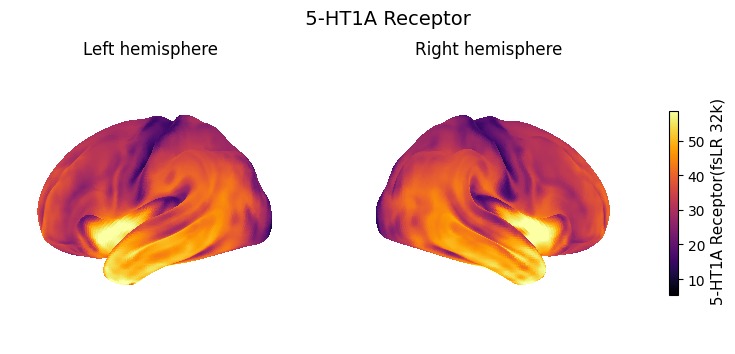


[References] Please cite the following papers if you are using this data:

  For {'source': 'margulies2016', 'desc': 'fcgradient01', 'space': 'fsLR', 'den': '32k'}:
  [primary]:
    Daniel S Margulies, Satrajit S Ghosh, Alexandros Goulas, Marcel Falkiewicz, Julia M Huntenburg, Georg Langs, Gleb Bezgin, Simon B Eickhoff, F Xavier Castellanos, Michael Petrides, and others. Situating the default-mode network along a principal gradient of macroscale cortical organization. Proc Natl Acad Sci USA, 113(44):12574–12579, 2016.
  [secondary]:
    


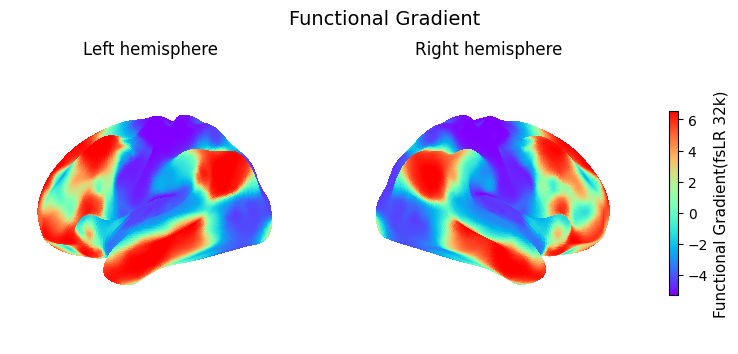


[References] Please cite the following papers if you are using this data:

  For {'source': 'raichle', 'desc': 'cmrglc', 'space': 'fsLR', 'den': '164k'}:
  [primary]:
    S Neil Vaishnavi, Andrei G Vlassenko, Melissa M Rundle, Abraham Z Snyder, Mark A Mintun, and Marcus E Raichle. Regional aerobic glycolysis in the human brain. Proceedings of the National Academy of Sciences, 107(41):17757–17762, 2010.
  [secondary]:
    


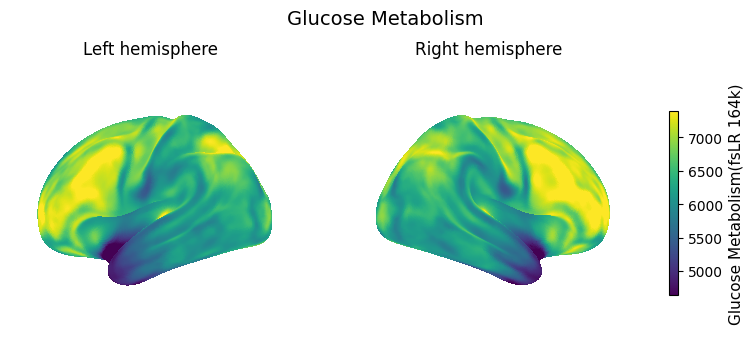


[References] Please cite the following papers if you are using this data:

  For {'source': 'mueller2013', 'desc': 'intersubjvar', 'space': 'fsLR', 'den': '164k'}:
  [primary]:
    Sophia Mueller, Danhong Wang, Michael D Fox, BT Thomas Yeo, Jorge Sepulcre, Mert R Sabuncu, Rebecca Shafee, Jie Lu, and Hesheng Liu. Individual variability in functional connectivity architecture of the human brain. Neuron, 77(3):586–595, 2013.
  [secondary]:
    


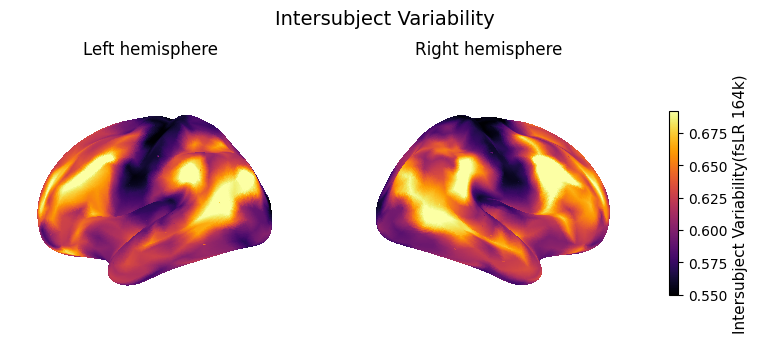


[References] Please cite the following papers if you are using this data:

  For {'source': 'abagen', 'desc': 'genepc1', 'space': 'fsaverage', 'den': '10k'}:
  [primary]:
    Michael J Hawrylycz, Ed S Lein, Angela L Guillozet-Bongaarts, Elaine H Shen, Lydia Ng, Jeremy A Miller, Louie N Van De Lagemaat, Kimberly A Smith, Amanda Ebbert, Zackery L Riley, and others. An anatomically comprehensive atlas of the adult human brain transcriptome. Nature, 489(7416):391, 2012.
    Ross D Markello, Aurina Arnatkeviciute, Jean-Baptiste Poline, Ben D Fulcher, Alex Fornito, and Bratislav Misic. Standardizing workflows in imaging transcriptomics with the abagen toolbox. eLife, 10:e72129, 2021.
  [secondary]:
    


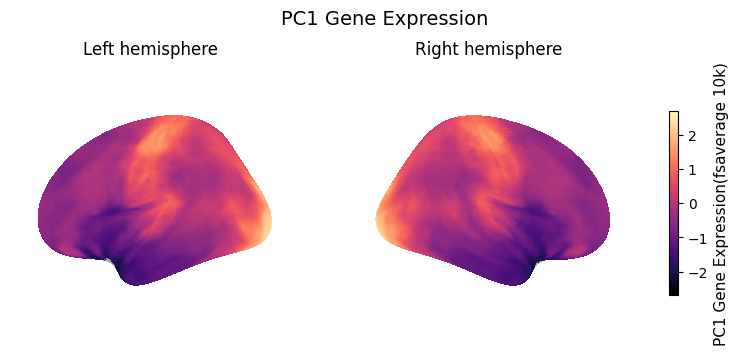


[References] Please cite the following papers if you are using this data:

  For {'source': 'hcps1200', 'desc': 'myelinmap', 'space': 'fsLR', 'den': '32k'}:
  [primary]:
    Matthew F Glasser, Timothy S Coalson, Emma C Robinson, Carl D Hacker, John Harwell, Essa Yacoub, Kamil Ugurbil, Jesper Andersson, Christian F Beckmann, Mark Jenkinson, and others. A multi-modal parcellation of human cerebral cortex. Nature, 536(7615):171–178, 2016.
  [secondary]:
    


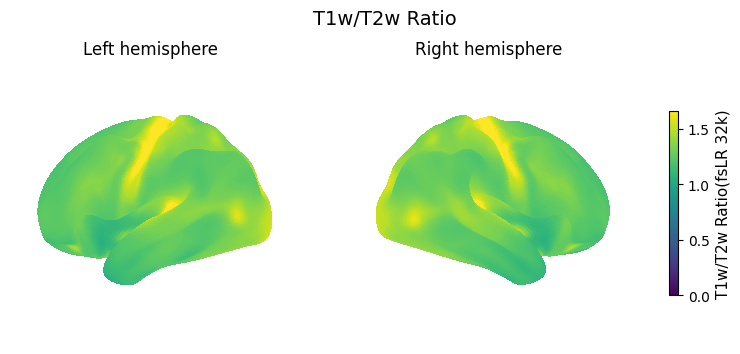


[References] Please cite the following papers if you are using this data:

  For {'source': 'hcps1200', 'desc': 'thickness', 'space': 'fsLR', 'den': '32k'}:
  [primary]:
    Matthew F Glasser, Timothy S Coalson, Emma C Robinson, Carl D Hacker, John Harwell, Essa Yacoub, Kamil Ugurbil, Jesper Andersson, Christian F Beckmann, Mark Jenkinson, and others. A multi-modal parcellation of human cerebral cortex. Nature, 536(7615):171–178, 2016.
  [secondary]:
    


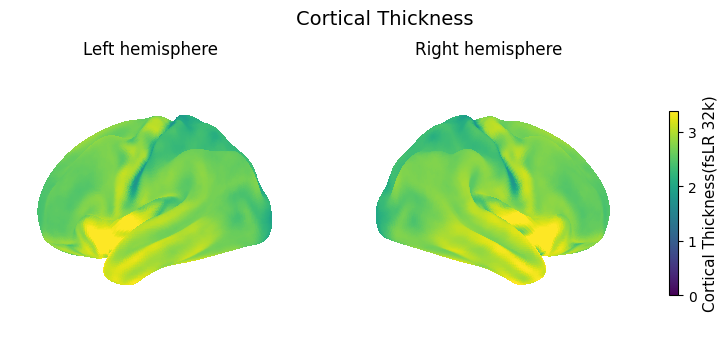


[References] Please cite the following papers if you are using this data:

  For {'source': 'reardon2018', 'desc': 'scalingnih', 'space': 'civet', 'den': '41k'}:
  [primary]:
    PK Reardon, Jakob Seidlitz, Simon Vandekar, Siyuan Liu, Raihaan Patel, Min Tae M Park, Aaron Alexander-Bloch, Liv S Clasen, Jonathan D Blumenthal, Francois M Lalonde, and others. Normative brain size variation and brain shape diversity in humans. Science, 360(6394):1222–1227, 2018.
  [secondary]:
    


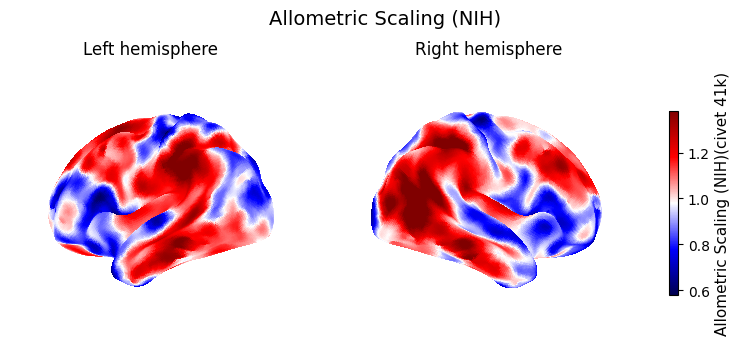

In [54]:
for map in brain_maps:
    plot_brain_map(map, readable_map_names, brain_map_settings)

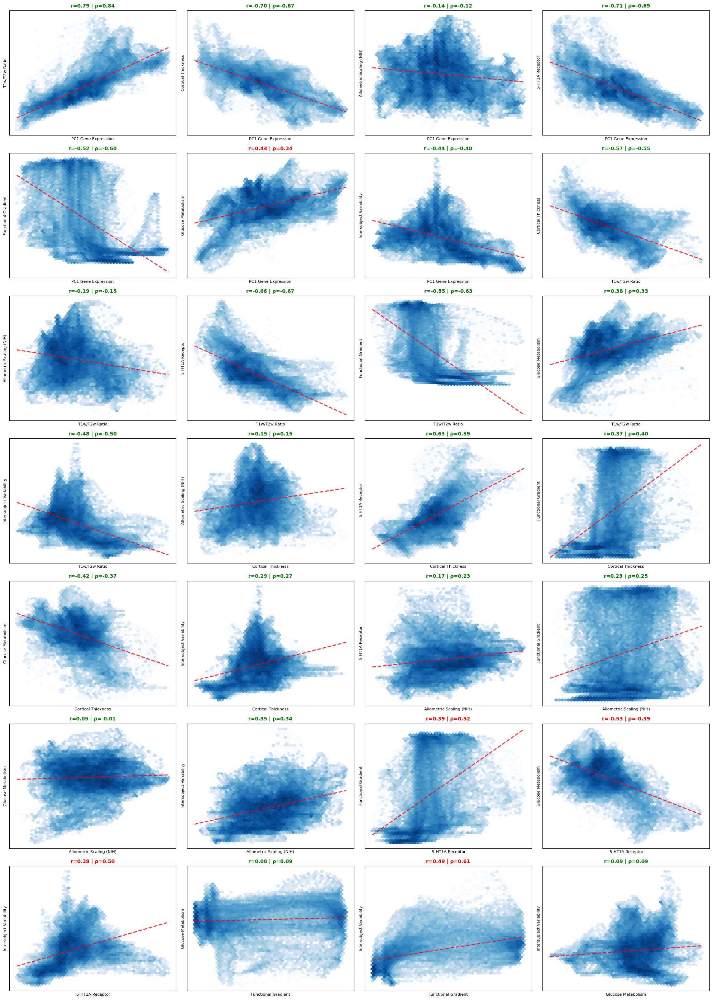

In [13]:
plot_pairwise_scatterplots(
    prepared_maps, 
    map_names, 
    readable_map_names=readable_map_names
)
# Green title means the the values are similar so we should use pearson
# red titles mean the values are different so we need to look at the hexbin/scatter plot
    # if it's curved or a dark blob with outliers --> use spearman

# for each vertex of the brain, plot the value of map1 vs map2 on the scatter plot

In [2]:
# Plotting Pearson r Correlation heatmap

df_corr, df_pvals, df_significant = compute_preliminary_matrix(
    prepared_maps, 
    map_names, 
    nulls_list, 
    n_perm=1000,
    readable_map_names=readable_map_names
)

print("\n--- Correlation Matrix (Pearson r) ---")
display(df_corr)

print("\n--- Significant Correlations (p < 0.05) ---")
display(df_significant)

plot_correlation_heatmaps(df_corr, df_significant, method='Pearson r')

NameError: name 'prepared_maps' is not defined

In [9]:
# Plotting Spearman Correlation heatmap

## Spearman Rank
def compute_preliminary_matrix_spearman(prepared_maps, map_names, nulls_list, n_perm=1000, readable_map_names=None):
    """
    correlation matrix using SPEARMAN RANK CORRELATION.
    Use this if your data has non-linear monotonic relationships.
    
    Parameters:
    - prepared_maps: List of numpy arrays (N_vertices,) for each map.
    - map_names: List of strings naming each map.
    - nulls_list: List of null arrays (N_vertices, n_perm) for each map.
    - n_perm: Number of permutations used (default 1000).
    - readable_map_names: Dictionary mapping map keys (desc) to readable strings.
    """

    data_stack = np.column_stack(prepared_maps)

    global_mask = np.all((~np.isnan(data_stack)) & (data_stack != 0), axis=1)
    
    clean_data = data_stack[global_mask]
    n_vertices_clean = clean_data.shape[0]
    
    # TRANSFORMATION FOR SPEARMAN: Rank the data
    # We rank down each column (axis=0)
    # This converts raw values to ranks (1st, 2nd, 3rd...)
    # NOTE: This is where Spearman differs from Pearson
    clean_data_ranked = np.apply_along_axis(rankdata, 0, clean_data)
    
    # Z-Score the RANKS (Standardization)
    # Pearson on Ranks == Spearman on Raw Data
    clean_data_z = zscore(clean_data_ranked, axis=0)
    
    print("\n--- Step 2: Compute Real Correlation Matrix (Spearman) ---")

    real_corr = (clean_data_z.T @ clean_data_z) / n_vertices_clean
    
    print("\n--- Step 3: Compute Spin P-Values (Uncorrected) ---")
    p_counts = np.zeros((len(prepared_maps), len(prepared_maps)))
    
    clean_nulls_list = [n[global_mask, :] for n in nulls_list]
    
    for k in range(n_perm):
        if k % 100 == 0: print(f"Permutation {k}/{n_perm}...")
        
        null_data_k = np.zeros_like(clean_data_z)
        for m in range(len(prepared_maps)):
            spin_k = clean_nulls_list[m][:, k]
            
            # CRITICAL: We must RANK the null data too for valid Spearman comparison
            # Handle NaNs if spins introduced them (though global mask helps)
            spin_k_ranked = rankdata(spin_k, nan_policy='omit')
            
            null_data_k[:, m] = zscore(spin_k_ranked, nan_policy='omit')
            
        null_corr_k = np.corrcoef(null_data_k.T)
        
        # Check: Is random correlation stronger than real correlation?
        is_stronger = np.abs(null_corr_k) >= np.abs(real_corr)
        p_counts += is_stronger.astype(int)

    p_values = (p_counts + 1) / (n_perm + 1)
    
    display_names = map_names
    if readable_map_names is not None:
        display_names = []
        for name in map_names:
            if name in readable_map_names:
                display_names.append(readable_map_names[name])
                continue
            found_match = False
            for key, val in readable_map_names.items():
                if name.endswith(f"_{key}"):
                    display_names.append(val)
                    found_match = True
                    break
            if not found_match:
                display_names.append(name)
    
    df_corr = pd.DataFrame(real_corr, index=display_names, columns=display_names).round(3)
    df_pvals = pd.DataFrame(p_values, index=display_names, columns=display_names).round(3)
    
    # Mask non-significant values (p > 0.05)
    df_significant = df_corr.copy()
    df_significant[df_pvals > 0.05] = 0
    
    return df_corr, df_pvals, df_significant


--- Step 2: Compute Real Correlation Matrix (Spearman) ---

--- Step 3: Compute Spin P-Values (Uncorrected) ---
Permutation 0/1000...
Permutation 100/1000...
Permutation 200/1000...
Permutation 300/1000...
Permutation 400/1000...
Permutation 500/1000...
Permutation 600/1000...
Permutation 700/1000...
Permutation 800/1000...
Permutation 900/1000...

--- Correlation Matrix (Spearman rho) ---


,PC1 Gene Expression,T1w/T2w Ratio,Cortical Thickness,Allometric Scaling (NIH),5-HT1A Receptor,Functional Gradient,Glucose Metabolism,Intersubject Variability
PC1 Gene Expression,1.000,0.842,-0.665,-0.117,-0.690,-0.595,0.340,-0.477
T1w/T2w Ratio,0.842,1.000,-0.553,-0.150,-0.671,-0.629,0.333,-0.499
Cortical Thickness,-0.665,-0.553,1.000,0.147,0.595,0.399,-0.366,0.269
Allometric Scaling (NIH),-0.117,-0.150,0.147,1.000,0.225,0.252,-0.013,0.342
5-HT1A Receptor,-0.690,-0.671,0.595,0.225,1.000,0.519,-0.391,0.497
Functional Gradient,-0.595,-0.629,0.399,0.252,0.519,1.000,0.092,0.612
Glucose Metabolism,0.340,0.333,-0.366,-0.013,-0.391,0.092,1.000,0.089
Intersubject Variability,-0.477,-0.499,0.269,0.342,0.497,0.612,0.089,1.000



--- Significant Correlations (p < 0.05) ---


,PC1 Gene Expression,T1w/T2w Ratio,Cortical Thickness,Allometric Scaling (NIH),5-HT1A Receptor,Functional Gradient,Glucose Metabolism,Intersubject Variability
PC1 Gene Expression,1.000,0.842,-0.665,-0.117,-0.690,-0.595,0.34,-0.477
T1w/T2w Ratio,0.842,0.000,-0.553,0.000,-0.671,-0.629,0.00,-0.499
Cortical Thickness,-0.665,-0.553,0.000,0.000,0.595,0.399,0.00,0.000
Allometric Scaling (NIH),-0.117,0.000,0.000,1.000,0.000,0.000,0.00,0.342
5-HT1A Receptor,-0.690,-0.671,0.595,0.000,0.000,0.519,0.00,0.497
Functional Gradient,-0.595,-0.629,0.399,0.000,0.519,1.000,0.00,0.612
Glucose Metabolism,0.340,0.000,0.000,0.000,0.000,0.000,1.00,0.000
Intersubject Variability,-0.477,-0.499,0.000,0.342,0.497,0.612,0.00,1.000


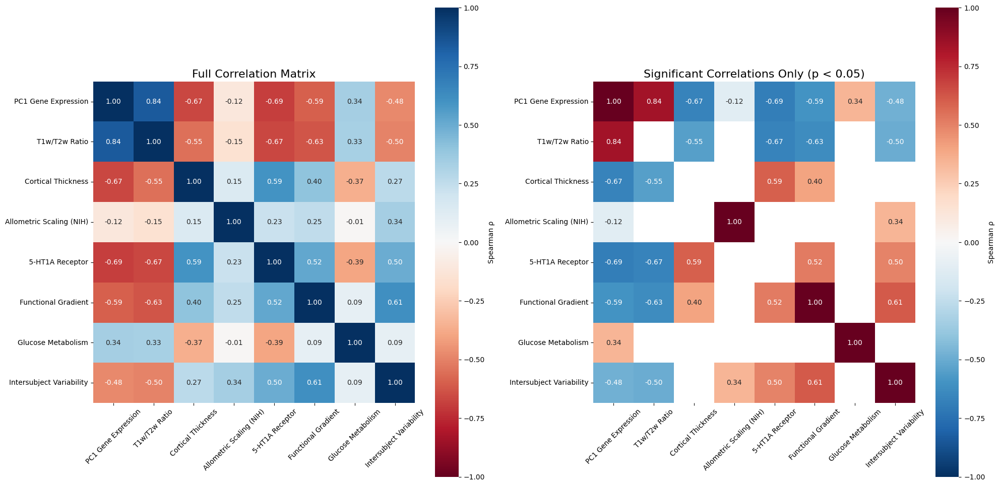

In [10]:
df_corr_spearman, df_pvals_spearman, df_significant_spearman = compute_preliminary_matrix_spearman(
    prepared_maps, 
    map_names, 
    nulls_list, 
    n_perm=1000,
    readable_map_names=readable_map_names
)

print("\n--- Correlation Matrix (Spearman rho) ---")
display(df_corr_spearman)

print("\n--- Significant Correlations (p < 0.05) ---")
display(df_significant_spearman)

plot_correlation_heatmaps(df_corr_spearman, df_significant_spearman, method='Spearman ρ')

### Multiple tests correction

In [11]:
# Mutltiple Tests correction table
def generate_standard_comparison_table(df_corr, df_pvals, alpha=0.05):
    """
    Computes Bonferroni and FDR BH and FDR BY corrections
    """
    
    mask_tri = np.tril(np.ones(df_pvals.shape), k=-1).astype(bool)
    rows, cols = np.where(mask_tri)
    
    map1_names = df_corr.index[rows]
    map2_names = df_corr.columns[cols]
    
    r_values = df_corr.values[mask_tri]
    p_values_uncorrected = df_pvals.values[mask_tri]
    
    # can use p-val for appendix additional tables
    reject_bonf, pvals_bonf, _, _ = multipletests(p_values_uncorrected, alpha=alpha, method='bonferroni')
    reject_fdr_bh, pvals_fdr_bh, _, _ = multipletests(p_values_uncorrected, alpha=alpha, method='fdr_bh')
    reject_fdr_by, pvals_fdr_by, _, _ = multipletests(p_values_uncorrected, alpha=alpha, method='fdr_by')
    
    results = pd.DataFrame({
        'Map 1': map1_names,
        'Map 2': map2_names,
        'Spearman': r_values,
        'P-val (Uncorrected)': p_values_uncorrected,
        'Significant (Uncorrected)': p_values_uncorrected < alpha,
        'Significant (Bonf)': reject_bonf,
        'Significant (FDR-BH)': reject_fdr_bh,
        'Significant (FDR-BY)': reject_fdr_by
    })
    
    float_cols = ['Spearman', 'P-val (Uncorrected)']
    results[float_cols] = results[float_cols].round(4)
    
    return results

# Helper function for Max T
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import rankdata, zscore

# --- Helper function for Max T (Same as before, robust to NaNs) ---
def compute_maxt_threshold(prepared_maps, nulls_list, n_perm=1000, method='pearson'):
    data_stack = np.column_stack(prepared_maps)
    global_mask = np.all((~np.isnan(data_stack)) & (data_stack != 0), axis=1)
    
    clean_data = data_stack[global_mask]
    n_vertices_clean = clean_data.shape[0]
    clean_nulls_list = [n[global_mask, :] for n in nulls_list]
    
    max_null_stats = []
    print(f"Running Max-T on {n_vertices_clean} vertices with {n_perm} permutations...")

    for k in range(n_perm):        
        null_data_k = np.zeros((n_vertices_clean, len(prepared_maps)))
        for m in range(len(prepared_maps)):
            spin_k = clean_nulls_list[m][:, k]
            if method == 'spearman':
                spin_k = rankdata(spin_k, method='average')
            
            with np.errstate(divide='ignore', invalid='ignore'):
                z_spin = zscore(spin_k, nan_policy='omit')
            null_data_k[:, m] = z_spin

        null_data_k = np.nan_to_num(null_data_k)
        null_corr_matrix = (null_data_k.T @ null_data_k) / n_vertices_clean 
        np.fill_diagonal(null_corr_matrix, 0)
        
        max_r = np.nanmax(np.abs(null_corr_matrix))
        max_null_stats.append(max_r)
        
    threshold = np.nanpercentile(max_null_stats, 95)
    print(f"Max-T Critical Threshold: r > {threshold:.3f}")
    return threshold


# --- Main function for Max T table (UPDATED) ---
def compute_and_display_maxt(df_corr, prepared_maps, nulls_list, method='pearson'):
    
    n_perm_actual = nulls_list[0].shape[1]
    
    # 1. Compute Threshold
    threshold = compute_maxt_threshold(prepared_maps, nulls_list, n_perm=n_perm_actual, method=method)
    
    if np.isnan(threshold):
        print("Error: Threshold is NaN.")
        return None, None

    # 2. Get ALL unique pairs (Lower Triangle)
    # We use the mask only to select the indices, not to filter results
    mask_tri = np.tril(np.ones(df_corr.shape), k=-1).astype(bool)
    rows, cols = np.where(mask_tri)
    
    map1_names = df_corr.index[rows]
    map2_names = df_corr.columns[cols]
    r_values = df_corr.values[rows, cols]
    
    # 3. Create DataFrame with ALL pairs
    maxt_table = pd.DataFrame({
        'Map 1': map1_names,
        'Map 2': map2_names,
        'Correlation': r_values,
        'Significant': np.abs(r_values) > threshold  # Logic check applied to all
    }).round(3)
    
    # Optional: Sort by strength so significant ones are at the top
    maxt_table = maxt_table.sort_values(by='Correlation', key=abs, ascending=False).reset_index(drop=True)
    
    print("\nFull Max-T Results (All Pairs):")
    display(maxt_table)
    
    # 4. Heatmap (Hiding Non-Significant)
    plt.figure(figsize=(10, 8))
    df_plot = df_corr.copy()
    
    # Create mask: True = Hide. So we hide if abs(r) <= threshold
    visual_mask = np.abs(df_plot) <= threshold
    np.fill_diagonal(visual_mask.values, False) # Always show diagonal
    
    sns.heatmap(
        df_plot, 
        annot=True, 
        fmt=".2f", 
        cmap='RdBu_r', 
        center=0, 
        vmin=-1, vmax=1,
        square=True,
        mask=visual_mask, # This hides the "False" ones from the visual
        cbar_kws={'label': f'{method.capitalize()} Correlation'}
    )
    plt.title(f"Significant Couplings (Max-T Corrected)\nThreshold: |r| > {threshold:.3f}", fontsize=14)
    plt.tight_layout()
    plt.show()
    
    return maxt_table, threshold

In [12]:
# Standard table
standard_table = generate_standard_comparison_table(df_corr_spearman, df_pvals_spearman)
print("\n--- Standard Multiple Comparisons Correction Table (Spearman)---")
display(standard_table)


--- Standard Multiple Comparisons Correction Table (Spearman)---


,Map 1,Map 2,Spearman,P-val (Uncorrected),Significant (Uncorrected),Significant (Bonf),Significant (FDR-BH),Significant (FDR-BY)
0,T1w/T2w Ratio,PC1 Gene Expression,0.842,0.001,True,True,True,True
1,Cortical Thickness,PC1 Gene Expression,-0.665,0.001,True,True,True,True
2,Cortical Thickness,T1w/T2w Ratio,-0.553,0.002,True,False,True,True
3,Allometric Scaling (NIH),PC1 Gene Expression,-0.117,0.001,True,True,True,True
4,Allometric Scaling (NIH),T1w/T2w Ratio,-0.150,0.467,False,False,False,False
5,Allometric Scaling (NIH),Cortical Thickness,0.147,0.373,False,False,False,False
6,5-HT1A Receptor,PC1 Gene Expression,-0.690,0.001,True,True,True,True
7,5-HT1A Receptor,T1w/T2w Ratio,-0.671,0.001,True,True,True,True
8,5-HT1A Receptor,Cortical Thickness,0.595,0.001,True,True,True,True
9,5-HT1A Receptor,Allometric Scaling (NIH),0.225,0.194,False,False,False,False


Running Max-T on 57830 vertices with 1000 permutations...
Max-T Critical Threshold: r > 0.511

Full Max-T Results (All Pairs):


,Map 1,Map 2,Correlation,Significant
0,T1w/T2w Ratio,PC1 Gene Expression,0.842,True
1,5-HT1A Receptor,PC1 Gene Expression,-0.690,True
2,5-HT1A Receptor,T1w/T2w Ratio,-0.671,True
3,Cortical Thickness,PC1 Gene Expression,-0.665,True
4,Functional Gradient,T1w/T2w Ratio,-0.629,True
5,Intersubject Variability,Functional Gradient,0.612,True
6,Functional Gradient,PC1 Gene Expression,-0.595,True
7,5-HT1A Receptor,Cortical Thickness,0.595,True
8,Cortical Thickness,T1w/T2w Ratio,-0.553,True
9,Functional Gradient,5-HT1A Receptor,0.519,True


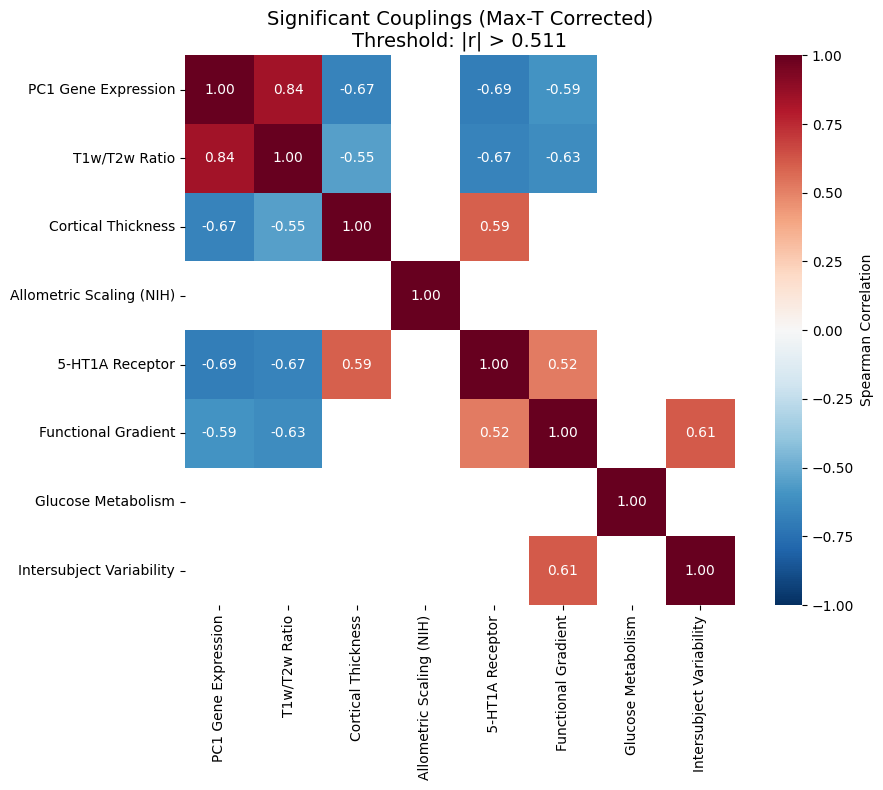

In [13]:
# Run Max-T and get the specific table/plot
# Method = spearman below
maxt_table, threshold = compute_and_display_maxt(
    df_corr_spearman, 
    prepared_maps, 
    nulls_list, 
    method='spearman'
)

# og

In [55]:
# # Run Max-T and get the specific table/plot
# # Method = spearman below
# maxt_table, threshold = compute_and_display_maxt(
#     df_corr_spearman, 
#     prepared_maps, 
#     nulls_list, 
#     method='spearman'
# )

### Plotting Coupling Brain maps

In [15]:
# ## Plotting coupling brain maps
# # the ones that have curved relationships in the scatter plots

# def generate_coupling_map(map1_data, map2_data, enhance_contrast=False):
#     mask = (~np.isnan(map1_data)) & (~np.isnan(map2_data)) & (map1_data != 0) & (map2_data != 0)
#     coupling_map = np.zeros_like(map1_data, dtype=float)
    
#     d1 = map1_data[mask]
#     d2 = map2_data[mask]

#     # Rank the data 0 to 1
#     r1 = rankdata(d1, method='average') / len(d1)
#     r2 = rankdata(d2, method='average') / len(d2)
    
#     diff = np.abs(r1 - r2)
#     coupling_score = 1.0 - diff
    
#     # --- IF STATEMENT ---
#     # Instead of clipping, we strictly increase the contrast.
#     # This keeps 0 at 0, 1 at 1, but pushes the "noise middle" (0.67) down to ~0.3
#     if enhance_contrast:
#         coupling_score = coupling_score ** 3

#     coupling_map[mask] = coupling_score
#     return coupling_map


# # same as coupling map but use for negative relationships
# def generate_NEGATIVE_coupling_map(map1_data, map2_data, enhance_contrast=False):
#     mask = (~np.isnan(map1_data)) & (~np.isnan(map2_data)) & (map1_data != 0) & (map2_data != 0)
#     coupling_map = np.zeros_like(map1_data, dtype=float)
    
#     d1 = map1_data[mask]
#     d2 = map2_data[mask]

#     # rank the data, compare diff units, but in the same coordiante system  
#     r1 = rankdata(d1, method='average') / len(d1)
#     r2 = rankdata(d2, method='average') / len(d2)
#     # divide to normalize data 0 to 1
#     diff = np.abs(r1 - r2)        
    
#     coupling_score = 1.0 - (1.0 - diff)
    
#     if enhance_contrast:
#         coupling_score = coupling_score ** 3

#     coupling_map[mask] = coupling_score
#     return coupling_map

# def plot_coupling_map(coupling_map_data, space='fsLR', den='32k', title='Local Coupling Strength', cmap='magma'):
#     from neuromaps.datasets import fetch_atlas
#     from neuromaps import plotting
    
#     # returns a dictionary with paths to the surface files
#     atlas = fetch_atlas(space, den)
#     surf_l = atlas['inflated'].L
#     surf_r = atlas['inflated'].R
    
#     # get L and R hemis
#     n_vertices = len(coupling_map_data)
#     mid_point = n_vertices // 2
#     data_l = coupling_map_data[:mid_point]
#     data_r = coupling_map_data[mid_point:]
    
#     fig = plt.figure(figsize=(10, 4))
    
#     vmin, vmax = 0, 1
    
#     # left hemi
#     ax1 = fig.add_subplot(1, 2, 1, projection='3d')
#     plotting.plot_surf(
#         surf_mesh=surf_l,
#         surf_map=data_l,
#         hemi='left',
#         view='lateral',
#         cmap=cmap,
#         vmin=vmin,
#         vmax=vmax,
#         colorbar=False,
#         axes=ax1,
#         title='Left Hemisphere'
#     )
    
#     # right hemi
#     ax2 = fig.add_subplot(1, 2, 2, projection='3d')
#     plotting.plot_surf(
#         surf_mesh=surf_r,
#         surf_map=data_r,
#         hemi='right',
#         view='lateral',
#         cmap=cmap,
#         vmin=vmin,
#         vmax=vmax,
#         colorbar=False,
#         axes=ax2,
#         title='Right Hemisphere'
#     )
    
#     sm = plt.cm.ScalarMappable(cmap=cmap)
#     sm.set_clim(vmin, vmax)
#     cbar = fig.colorbar(sm, ax=[ax1, ax2], shrink=0.6, location='right')
#     cbar.set_label(f'{title}', fontsize=11)
    
#     plt.suptitle(title, fontsize=14)
#     plt.show()

In [23]:
map_names

['abagen_genepc1',
 'hcps1200_myelinmap',
 'hcps1200_thickness',
 'reardon2018_scalingnih',
 'savli2012_way100635',
 'margulies2016_fcgradient01',
 'raichle_cmrglc',
 'mueller2013_intersubjvar']

In [24]:
prepared_maps

[array([-0.14960021,  0.71435326,  0.5332251 , ..., -0.7673894 ,
        -0.7618149 , -0.73177356], shape=(64984,), dtype=float32),
 array([1.3455285, 1.3452077, 1.3974727, ..., 1.2362034, 1.2334827,
        1.2351799], shape=(64984,), dtype=float32),
 array([3.0777564, 2.034869 , 2.9712224, ..., 3.0268323, 3.047197 ,
        2.9889643], shape=(64984,), dtype=float32),
 array([1.1884882 , 0.81385535, 0.8314943 , ..., 1.2012281 , 1.1712425 ,
        1.2115377 ], shape=(64984,), dtype=float32),
 array([37.421368, 27.300804, 23.448963, ..., 44.939358, 44.68842 ,
        43.892735], shape=(64984,), dtype=float32),
 array([ 6.379188 , -4.9558477, -2.9024293, ...,  5.802551 ,  5.9602456,
         5.8580394], shape=(64984,), dtype=float32),
 array([7599.0854, 6243.808 , 6665.2417, ..., 6220.3965, 6168.7764,
        6209.3174], shape=(64984,), dtype=float32),
 array([0.58998483, 0.57853687, 0.6059104 , ..., 0.6446652 , 0.64774984,
        0.65093017], shape=(64984,), dtype=float32)]

In [ ]:
## NEED TO CHECK FOR NEGATIVE RELATIONSHIP
# gene exp and myelin are neg with func gradeint
#cort thickness and func gradient are pos
#5ht1a and func grad are pos

# ['abagen_genepc1', 0
#  'hcps1200_myelinmap', 1
#  'hcps1200_thickness', 2
#  'reardon2018_scalingnih', 3
#  'savli2012_way100635', 4
#  'margulies2016_fcgradient01', 5
#  'raichle_cmrglc', 6
#  'mueller2013_intersubjvar'] 7

: 

In [16]:
# ## plotting the coupling for myelin and functional gradient
# # raw data had a s or hockey stick curve --> regional relationships
# # ranked has a negative linear relationship, loose though

# idx_myelin = 1
# idx_gradient = 5
# map_A = prepared_maps[idx_myelin]
# map_B = prepared_maps[idx_gradient]

# coupling_brain = generate_NEGATIVE_coupling_map(map_A, map_B)

# plot_coupling_map(coupling_brain, title='Myelin vs Functional Gradient Ranked Coupling')

In [17]:
# ## plotting coupling for Gene PC1 and myelin (structure to structure)
# # raw data had a positive linear relationship
# # ranked data had a positive linear relationship

# # ['abagen_genepc1', 0
# #  'hcps1200_myelinmap', 1
# #  'hcps1200_thickness', 2
# #  'reardon2018_scalingnih', 3
# #  'savli2012_way100635', 4
# #  'margulies2016_fcgradient01', 5
# #  'raichle_cmrglc', 6
# #  'mueller2013_intersubjvar'] 7

# idx_pc1 = 0
# idx_myelin = 1
# map_A = prepared_maps[idx_pc1]
# map_B = prepared_maps[idx_myelin]

# coupling_brain = generate_coupling_map(map_A, map_B)

# plot_coupling_map(coupling_brain, title='PC1 Gene Expression vs Myelin Ratio Ranked Coupling')

In [18]:
# ## plotting NIH and Gluco Metabolism
# # raw has no relationship, big cloud desnity heavy
# # ranked no relationship with rho=-0.01, yellow spots scattered all over

# # ['abagen_genepc1', 0
# #  'hcps1200_myelinmap', 1
# #  'hcps1200_thickness', 2
# #  'reardon2018_scalingnih', 3
# #  'savli2012_way100635', 4
# #  'margulies2016_fcgradient01', 5
# #  'raichle_cmrglc', 6
# #  'mueller2013_intersubjvar'] 7

# idx_nih = 3
# idx_gradient = 6
# map_A = prepared_maps[idx_nih]
# map_B = prepared_maps[idx_gradient]

# coupling_brain = generate_coupling_map(map_A, map_B)

# plot_coupling_map(coupling_brain, title='NIH vs Glucose Metabolism Ranked Coupling')

In [56]:
# ## plotting all unique pairs function

# readable_map_names = {
#     'genepc1': 'PC1 Gene Expression',
#     'myelinmap': 'T1w/T2w Ratio',
#     'thickness': 'Cortical Thickness',
#     'fcgradient01': 'Functional Gradient',
#     'intersubjvar': 'Intersubject Variability',
#     'cmrglc': 'Glucose Metabolism',
#     'scalingnih': 'Allometric Scaling (NIH)',
#     'way100635': '5-HT1A Receptor'
# }

# def get_readable_title(raw_name, name_dict):
#     for key, readable in name_dict.items():
#         if key in raw_name:
#             return readable
#     return raw_name

# def plot_coupling_map(coupling_map_data, space='fsLR', den='32k', title='Local Coupling Strength', cmap='magma'):
#     atlas = fetch_atlas(space, den)
#     surf_l = atlas['inflated'].L
#     surf_r = atlas['inflated'].R

#     n_vertices = len(coupling_map_data)
#     mid_point = n_vertices // 2
#     data_l = coupling_map_data[:mid_point]
#     data_r = coupling_map_data[mid_point:]
    
#     fig = plt.figure(figsize=(10, 4))
    
#     vmin, vmax = 0, 1
    
#     # Left hemi
#     ax1 = fig.add_subplot(1, 2, 1, projection='3d')
#     plotting.plot_surf(
#         surf_mesh=surf_l,
#         surf_map=data_l,
#         hemi='left',
#         view='lateral',
#         cmap=cmap,
#         vmin=vmin,
#         vmax=vmax,
#         colorbar=False,
#         axes=ax1,
#         title='Left Hemisphere'
#     )
    
#     # Right hemi
#     ax2 = fig.add_subplot(1, 2, 2, projection='3d')
#     plotting.plot_surf(
#         surf_mesh=surf_r,
#         surf_map=data_r,
#         hemi='right',
#         view='lateral',
#         cmap=cmap,
#         vmin=vmin,
#         vmax=vmax,
#         colorbar=False,
#         axes=ax2,
#         title='Right Hemisphere'
#     )
    
#     sm = plt.cm.ScalarMappable(cmap=cmap)
#     sm.set_clim(vmin, vmax)
#     cbar = fig.colorbar(sm, ax=[ax1, ax2], shrink=0.6, location='right')
#     cbar.set_label('Coupling Strength', fontsize=11)
    
#     plt.suptitle(title, fontsize=14)
#     plt.show()


# # Coupling Brain Map Function
# def generate_coupling_map(map1_data, map2_data, positive=True):
#     mask = (~np.isnan(map1_data)) & (~np.isnan(map2_data)) & (map1_data != 0) & (map2_data != 0)
#     coupling_map = np.zeros_like(map1_data, dtype=float)
    
#     d1 = map1_data[mask]
#     d2 = map2_data[mask]

#     # Rank 0 to 1
#     r1 = rankdata(d1, method='average') / len(d1)
    
#     # Logic Switch: Invert r2 if relationship is negative
#     if positive:
#         r2 = rankdata(d2, method='average') / len(d2)
#     else:
#         r2 = 1.0 - (rankdata(d2, method='average') / len(d2))
    
#     # Calculate similarity
#     diff = np.abs(r1 - r2)
#     coupling_score = 1.0 - diff
#     # cubing the score makes it ... 
#     coupling_score = coupling_score ** 3
    
#     coupling_map[mask] = coupling_score
#     return coupling_map

# def plot_all_unique_pairs(map_names, prepared_maps, name_dict):
#     unique_pairs = list(combinations(range(len(map_names)), 2))

#     for i, (idx_a, idx_b) in enumerate(unique_pairs):
#         name_a_raw = map_names[idx_a]
#         name_b_raw = map_names[idx_b]
#         data_a = prepared_maps[idx_a]
#         data_b = prepared_maps[idx_b]
        
#         mask = (~np.isnan(data_a)) & (~np.isnan(data_b))
#         rho, _ = spearmanr(data_a[mask], data_b[mask])
        
#         # If correlation is notably negative, flip the math
#         is_positive = rho >= -0.1
        
#         # B. Generate Map
#         coupling_brain = generate_coupling_map(data_a, data_b, positive=is_positive)
        
#         title_a = get_readable_title(name_a_raw, name_dict)
#         title_b = get_readable_title(name_b_raw, name_dict)
        
#         full_title = f"{title_a} vs {title_b} (ρ={rho:.2f})"
        

#         plot_coupling_map(coupling_brain, title=full_title)

In [63]:
def get_readable_title(raw_name, name_dict):
    """Converts technical map name to readable title."""
    for key, readable in name_dict.items():
        if key in raw_name:
            return readable
    return raw_name

def generate_coupling_map(map1_data, map2_data, positive=True):
    """
    Generates a "Local Coupling Map" (Rank Difference Map).
    Cubed score highlights strong coupling.
    """
    # Create mask for valid data (remove NaNs and Zeros)
    mask = (~np.isnan(map1_data)) & (~np.isnan(map2_data)) & (map1_data != 0) & (map2_data != 0)
    coupling_map = np.zeros_like(map1_data, dtype=float)
    
    d1 = map1_data[mask]
    d2 = map2_data[mask]

    # Rank 0 to 1
    r1 = rankdata(d1, method='average') / len(d1)
    
    # Logic Switch: Invert r2 if relationship is negative
    if positive:
        r2 = rankdata(d2, method='average') / len(d2)
    else:
        r2 = 1.0 - (rankdata(d2, method='average') / len(d2))
    
    # Calculate similarity
    diff = np.abs(r1 - r2)
    coupling_score = 1.0 - diff
    
    # Cube the score to suppress noise (Mean ~0.66 -> ~0.3)
    coupling_score = coupling_score ** 3
    
    coupling_map[mask] = coupling_score
    return coupling_map

def plot_coupling_map(coupling_map_data, space='fsLR', den='32k', title='Local Coupling Strength', cmap='magma'):
    """
    Plots the coupling map using neuromaps plotting utilities.
    """
    # 1. Fetch atlas geometry
    atlas = fetch_atlas(space, den)
    surf_l = atlas['inflated'].L
    surf_r = atlas['inflated'].R

    # 2. Split data into Hemispheres
    n_vertices = len(coupling_map_data)
    mid_point = n_vertices // 2
    data_l = coupling_map_data[:mid_point]
    data_r = coupling_map_data[mid_point:]
    
    # 3. Setup Figure
    fig = plt.figure(figsize=(10, 4))
    vmin, vmax = 0, 1 # Fixed scale for comparison
    
    # Left Hemi
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    plotting.plot_surf(
        surf_mesh=surf_l,
        surf_map=data_l,
        hemi='left',
        view='lateral',
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        colorbar=False,
        axes=ax1,
        title='Left Hemisphere'
    )
    
    # Right Hemi
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    plotting.plot_surf(
        surf_mesh=surf_r,
        surf_map=data_r,
        hemi='right',
        view='lateral',
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        colorbar=False,
        axes=ax2,
        title='Right Hemisphere'
    )
    
    # Colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap)
    sm.set_clim(vmin, vmax)
    cbar = fig.colorbar(sm, ax=[ax1, ax2], shrink=0.6, location='right')
    cbar.set_label('Coupling Strength', fontsize=11)
    
    plt.suptitle(title, fontsize=14, y=0.95)
    plt.show()

# --- MAIN LOOP FUNCTION ---

def plot_all_unique_pairs(map_names, prepared_maps, name_dict):
    """
    Iterates through all unique pairs of maps, calculates Spearman Rho,
    determines direction (pos/neg), generates coupling map, and plots it.
    """
    unique_pairs = list(combinations(range(len(map_names)), 2))

    for i, (idx_a, idx_b) in enumerate(unique_pairs):
        name_a_raw = map_names[idx_a]
        name_b_raw = map_names[idx_b]
        data_a = prepared_maps[idx_a]
        data_b = prepared_maps[idx_b]
        
        # Calculate Spearman correlation for title & direction
        mask = (~np.isnan(data_a)) & (~np.isnan(data_b)) & (data_a != 0) & (data_b != 0)
        rho, _ = spearmanr(data_a[mask], data_b[mask])
        
        # If correlation is notably negative, flip the ranking logic
        # Threshold of -0.1 ensures weak negatives are treated as inverse
        is_positive = rho >= -0.1 
        
        # Generate the Coupling Map
        coupling_brain = generate_coupling_map(data_a, data_b, positive=is_positive)
        
        # Create Title
        title_a = get_readable_title(name_a_raw, name_dict)
        title_b = get_readable_title(name_b_raw, name_dict)
        
        full_title = f"{title_a} vs {title_b} (ρ={rho:.2f})"
    
        plot_coupling_map(coupling_brain, title=full_title)

/var/folders/ff/1nvxwnl16fs1my8jhytzdqxw0000gn/T/ipykernel_16734/4060006772.py:60: DeprecationWarning: The `darkness` parameter will be deprecated in release 0.13. We recommend setting `darkness` to None
  plotting.plot_surf(
/var/folders/ff/1nvxwnl16fs1my8jhytzdqxw0000gn/T/ipykernel_16734/4060006772.py:75: DeprecationWarning: The `darkness` parameter will be deprecated in release 0.13. We recommend setting `darkness` to None
  plotting.plot_surf(


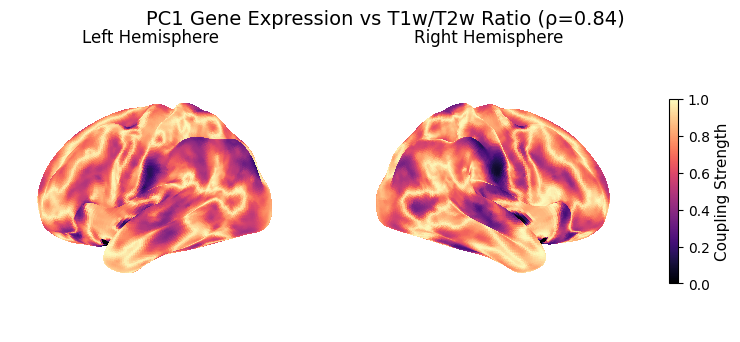

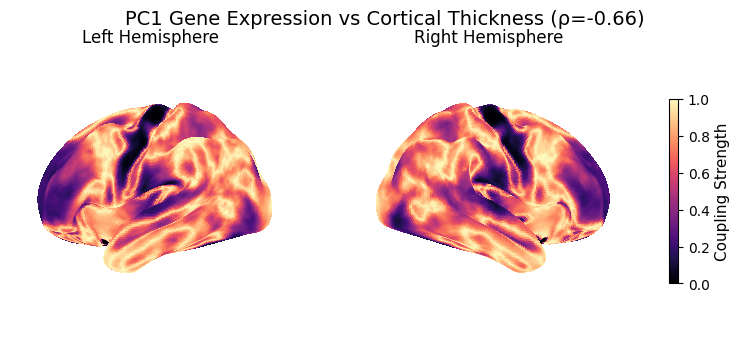

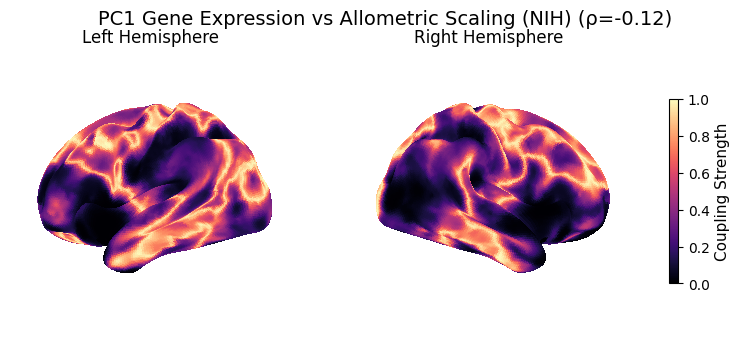

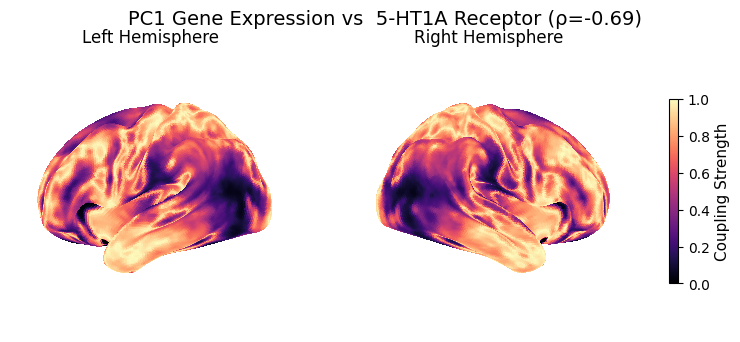

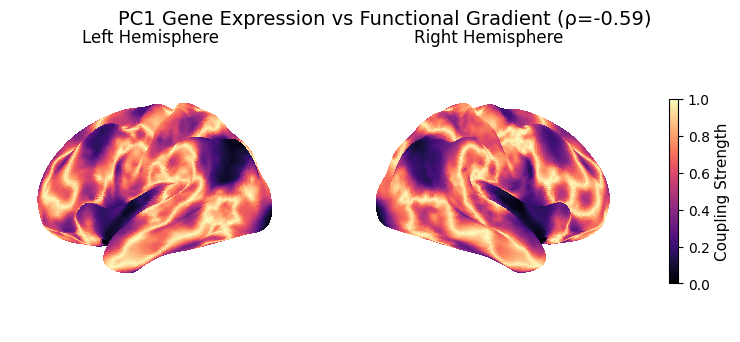

...

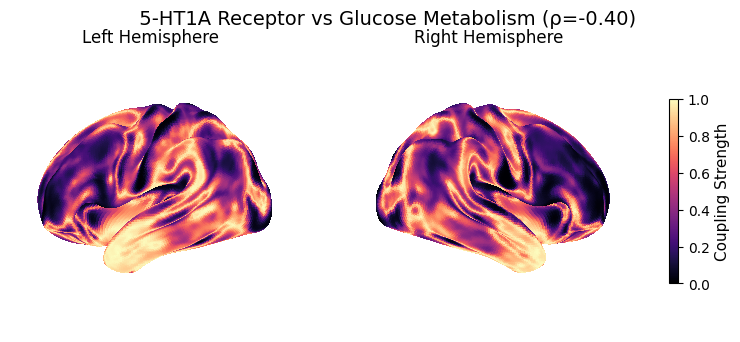

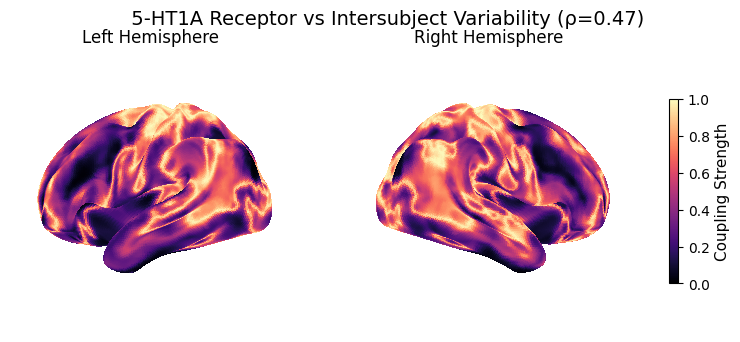

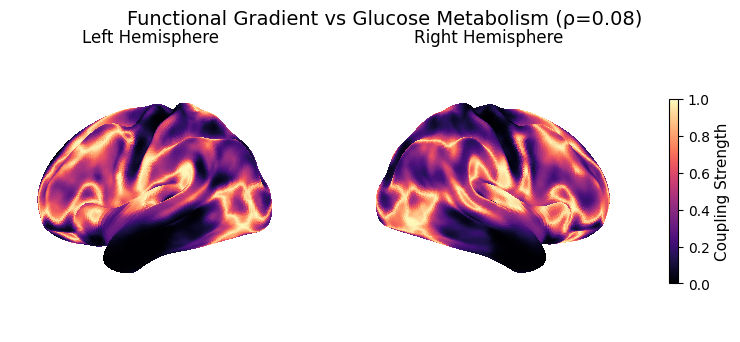

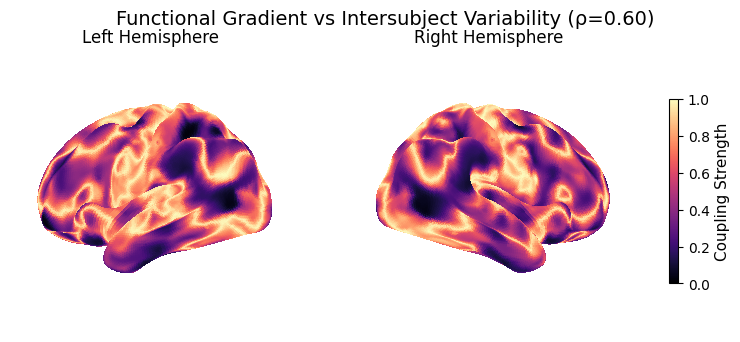

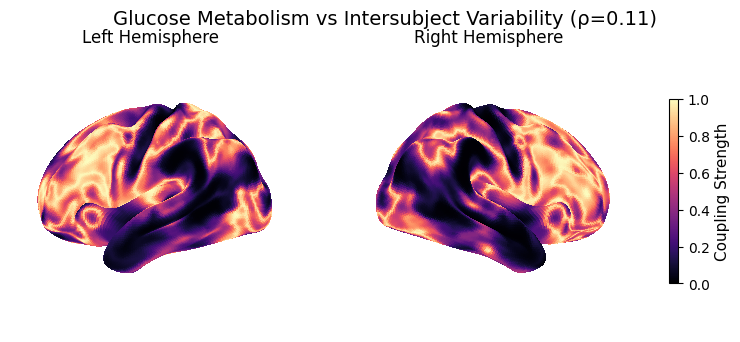

In [64]:
plot_all_unique_pairs(map_names, prepared_maps, readable_map_names)

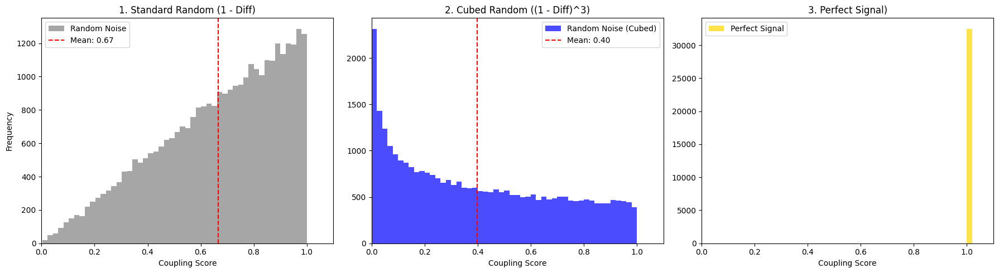

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.stats import rankdata

# def run_coupling_simulation(n_points=32492):    
#     x_rand = np.random.rand(n_points)
#     y_rand = np.random.rand(n_points)
    
#     r1 = rankdata(x_rand) / n_points
#     r2 = rankdata(y_rand) / n_points
    
#     # RANDOM
#     diff_rand = np.abs(r1 - r2)
#     coupling_linear = 1.0 - diff_rand
#     coupling_cubed = coupling_linear ** 3
    
#     # Perfect coupling
#     diff_perf = np.abs(r1 - r1)
#     coupling_perf_linear = 1.0 - diff_perf
#     coupling_perf_cubed = coupling_perf_linear #** 3
    
#     fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
#     axes[0].hist(coupling_linear, bins=50, color='gray', alpha=0.7, label='Random Noise')
#     axes[0].axvline(x=np.mean(coupling_linear), color='red', linestyle='--', label=f'Mean: {np.mean(coupling_linear):.2f}')
#     axes[0].set_title("1. Standard Random (1 - Diff)")
#     axes[0].set_xlabel("Coupling Score")
#     axes[0].set_ylabel("Frequency")
#     axes[0].legend()
#     axes[0].set_xlim(0, 1.1)
    
#     axes[1].hist(coupling_cubed, bins=50, color='blue', alpha=0.7, label='Random Noise (Cubed)')
#     axes[1].axvline(x=np.mean(coupling_cubed), color='red', linestyle='--', label=f'Mean: {np.mean(coupling_cubed):.2f}')
#     axes[1].set_title("2. Cubed Random ((1 - Diff)^3)")
#     axes[1].set_xlabel("Coupling Score")
#     axes[1].legend()
#     axes[1].set_xlim(0, 1.1)
    
#     axes[2].hist(coupling_perf_cubed, bins=50, color='gold', alpha=0.7, label='Perfect Signal')
#     axes[2].set_title("3. Perfect Signal)")
#     axes[2].set_xlabel("Coupling Score")
#     axes[2].legend()
#     axes[2].set_xlim(0, 1.1)
    
#     plt.tight_layout()
#     plt.show()
    
#     # print("\nInterpretation:")
#     # print("1. Standard Random: Trends UPWARD (Mean ~0.66). Noise looks like signal.")
#     # print("2. Cubed Random: Trends DOWNWARD (Mean ~0.25). Noise is suppressed.")
#     # print("3. Perfect Signal: Stays at 1.0. The 'contrast' between signal (1.0) and noise (0.25) is maximized.")

# run_coupling_simulation()

### Make Scatterplot with Ranked Data

In [22]:
def pairwise_rank_scatterplot(prepared_maps, map_names, readable_map_names=None):
    
    # 1. Global Masking
    data_stack = np.column_stack(prepared_maps)
    global_mask = np.all((~np.isnan(data_stack)) & (data_stack != 0), axis=1)
    clean_data = data_stack[global_mask]
    
    # 2. Rank Transform the Data (Column-wise)
    # This converts raw values to ranks (0, 1, 2... N)
    ranked_data = np.apply_along_axis(rankdata, 0, clean_data)
    
    n_maps = len(prepared_maps)
    
    # Resolve names
    display_names = map_names
    if readable_map_names:
        display_names = []
        for name in map_names:
            if name in readable_map_names:
                display_names.append(readable_map_names[name])
                continue
            found_match = False
            for key, val in readable_map_names.items():
                if name.endswith(f"_{key}"):
                    display_names.append(val)
                    found_match = True
                    break
            if not found_match: display_names.append(name)

    # Setup Plot Grid
    import math
    n_pairs = (n_maps * (n_maps - 1)) // 2
    n_cols = 4
    n_rows = math.ceil(n_pairs / n_cols)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
    axes = axes.flatten()
    
    plot_idx = 0
    
    for i in range(n_maps):
        for j in range(i + 1, n_maps):
            ax = axes[plot_idx]
            
            # Use RANKED data
            x = ranked_data[:, i]
            y = ranked_data[:, j]
            
            # Compute stats (On ranks, Pearson == Spearman)
            rho, _ = pearsonr(x, y) 
            
            # Hexbin Plot
            hb = ax.hexbin(x, y, gridsize=50, cmap='viridis', mincnt=1, bins='log')
            
            # Trendline
            z = np.polyfit(x, y, 1)
            p = np.poly1d(z)
            x_range = np.linspace(x.min(), x.max(), 100)
            ax.plot(x_range, p(x_range), "r--", alpha=0.8, linewidth=2)
            
            ax.set_xlabel(f"{display_names[i]} (Rank)", fontsize=8)
            ax.set_ylabel(f"{display_names[j]} (Rank)", fontsize=8)
            
            ax.set_title(f"Spearman ρ={rho:.2f}", fontsize=10, fontweight='bold')
            ax.set_xticks([])
            ax.set_yticks([])
            
            plot_idx += 1
        
    for k in range(plot_idx, len(axes)):
        axes[k].axis('off')
        
    plt.tight_layout()
    plt.show()

In [23]:
# plot_pairwise_scatterplots(
#     prepared_maps, 
#     map_names, 
#     readable_map_names=readable_map_names
# )

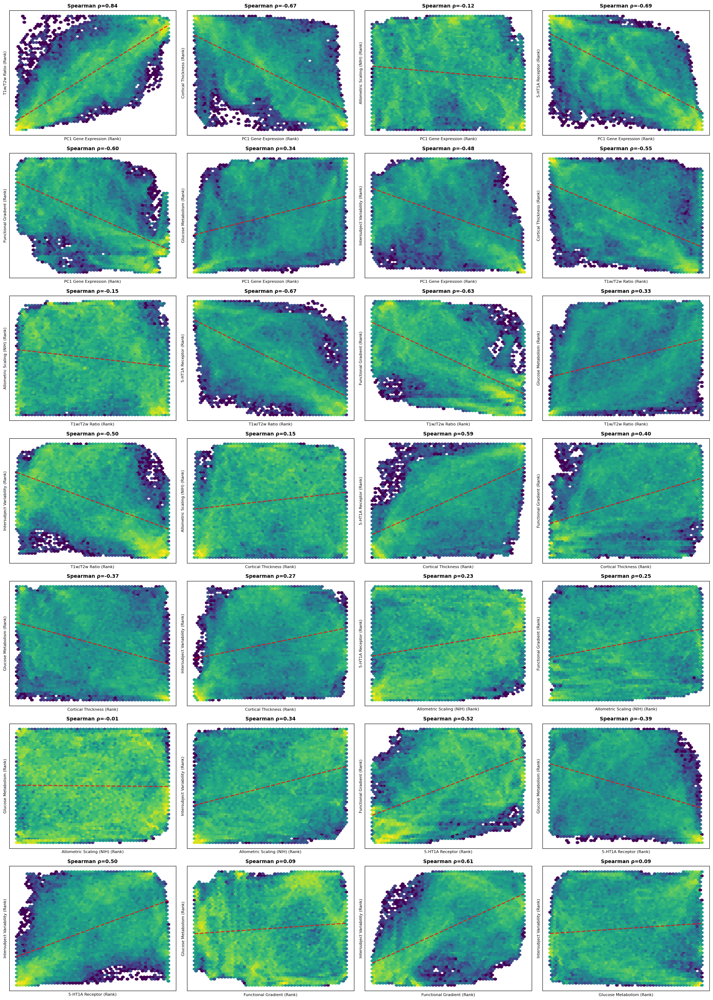

In [24]:
pairwise_rank_scatterplot(
    prepared_maps, 
    map_names, 
    readable_map_names=readable_map_names
)

# **What to look for:**
# * If your "Hockey Stick" curves from the previous plot turn into straight diagonal lines here, it confirms the relationship is **monotonic** and Spearman is the correct metric.
# * If they still look like blobs, there is no relationship.

Scenario A: Positive CorrelationLook for: A yellow cloud stretching from $(0,0)$ to $(30k, 30k)$.
Meaning: Low ranks go with low ranks; high ranks go with high ranks.

Scenario B: Negative CorrelationLook for: A yellow cloud stretching from Top-Left to Bottom-Right.Meaning: High ranks go with low ranks.

Scenario C: No CorrelationLook for: A diffuse yellow cloud in the center, or random yellow patches everywhere. No clear direction.

Yellow/Bright Green (High Density): This is where the points are most concentrated.

In a rank plot, this is your "trend line."

If the yellow blobs form a diagonal line (from bottom-left to top-right), it means Positive Correlation.

If they form a diagonal from top-left to bottom-right, it means Negative Correlation.


Dark Blue/Purple (Low Density): These are areas with fewer points.

If the whole square is dark blue with just a few random yellow spots, there is No Relationship.